### Porównanie czasu działania - Test "Małopolska"

Dane zawierają współrzędne geograficzne (szerokość i długość geograficzną) wszystkich tras, po których teoretycznie mogą poruszać się rowerzyści w województwie małopolskim. Współrzędne te opisują drogi, ścieżki oraz inne trasy dostępne dla ruchu rowerowego, obejmując zarówno tereny miejskie, jak i wiejskie. Zbiór danych może być wykorzystany do analizy przestrzennej tras rowerowych, planowania infrastruktury rowerowej czy optymalizacji szlaków w kontekście turystyki i rekreacji.

Dane te posłużą do przeprowadzenia testów wydajnościowych dwóch struktur danych: KdTree oraz QuadTree. Dzięki analizie tras rowerowych w województwie małopolskim, możliwe będzie porównanie efektywności obu struktur pod kątem konstrukcji oraz realizacji zapytań w kontekście rzeczywistych, przestrzennych danych geograficznych. Testy te pozwolą ocenić, która ze struktur lepiej sprawdza się w przypadku dużych, złożonych zbiorów danych o charakterystyce geograficznej, takich jak trasy rowerowe.

In [38]:
from src.kdtree import *
from src.Quadtree import *
from src.rectangle import *
from typing import List, Tuple, Optional
from tester import *

In [39]:
import ast

def load_points(path: str) -> List[Tuple[int, int]]:
    points = []
    with open(path, 'r') as file:
        line = file.read().strip()
    return ast.literal_eval(line)

points = np.array(load_points("bigtest1.in"))

In [40]:
import plotly.express as px
import pandas as pd
import numpy as np

df = pd.DataFrame(points, columns=["Longitude", "Latitude"])

target_center = {"lon": 20, "lat": 50}
zoom_level = 8

fig = px.scatter_geo(df.sample(200000),
                     lat="Longitude", lon="Latitude", # w naszych danych współrzędne są odwrócone
                     projection="natural earth")

fig.update_geos(center=target_center, projection_scale=zoom_level)
fig.show()


In [41]:
Wawel = (50.049683, 19.944544)
D17 = (50.068048, 19.912671)
A0 = (50.064500, 19.923483)
D10 = (50.065314, 19.916310)
Zakrzowek = (50.036307, 19.909372)

In [42]:
def coords_to_rect(coords1: Tuple[float, float], coords2: Tuple[float, float]) -> Rectangle:
    return Rectangle(min(coords1[0], coords2[0]), min(coords1[1], coords2[1]), max(coords2[0], coords1[0]), max(coords2[1], coords2[0]))

In [43]:
def brut(points: np.ndarray, rectangle: Rectangle) -> List[Tuple[float, float]]:
    res = filter(lambda x: rectangle.contains(x), points)
    return list(res)

def check_if_equal(l1: List["Node"], l2: List[Tuple[Tuple[float, float], int]], l3: List[Tuple[float, float]]) -> bool:
    s1 = sum([x.count for x in l1])
    s2 = sum([x[1] for x in l2])
    if s1 != s2 or s1 != len(l3):
        return False
    
    l3 = [tuple(point) for point in np.unique(l3, axis=0)]
    l1_sorted = sorted(l1, key=lambda x: (x.point[0], x.point[1]))
    l2_sorted = sorted(l2, key=lambda x: (x[0][0], x[0][1]))
    l3_sorted = sorted(l3, key=lambda x: (x[0], x[1]))
    
    if len(l1_sorted) != len(l2_sorted) or len(l1_sorted) != len(l3_sorted):
        print(len(l1_sorted), len(l2_sorted), len(l3_sorted))
        return False
    
    for i in range(len(l1_sorted)):
        if (abs(l1_sorted[i].point[0] - l2_sorted[i][0][0]) > 1e-12 or
            abs(l1_sorted[i].point[1] - l2_sorted[i][0][1]) > 1e-12):
            return False
    
    for i in range(len(l1_sorted)):
        if (abs(l1_sorted[i].point[0] - l3_sorted[i][0]) > 1e-12 or
            abs(l1_sorted[i].point[1] - l3_sorted[i][1]) > 1e-12):
            return False
    
    return True

In [44]:
kd = KdTree(points)

In [45]:
quad = QuadTree(points)

In [46]:
rect = coords_to_rect(D17, Wawel)

In [47]:
import timeit

print(timeit.timeit(lambda: list(kd.search_rectangle(rect)), number=5)/5)
res_kd = list(kd.search_rectangle(rect))

print(timeit.timeit(lambda: list(quad.search_rectangle(rect)), number=5)/5)
res_quad = list(quad.search_rectangle_with_count(rect))

print(timeit.timeit(lambda: brut(points, rect), number=5)/5)

check_if_equal(res_kd, res_quad, brut(points, rect))
print(len(res_kd))

0.010192339999775868
0.016644679999444634
0.09725896000018111
11181


### Przykład działania wizualizacji.

In [48]:
from src.kdtreeVis import *
from src.QuadtreeVis import *
from src.rectangle import *
from testmanager import *

In [49]:
points, rect = random_uniform_test(20)
rect = Rectangle(40, 35, 80, 70)

Wizualizacja działania QuadTree z parametrem max_capacity = 1

In [50]:
#QUADTREE VISUALIZATION 

quad = QuadTreeVis(points,1)
# quad.vis.save("quadtree_build")
# quad.vis.save_gif("quadtree_build")

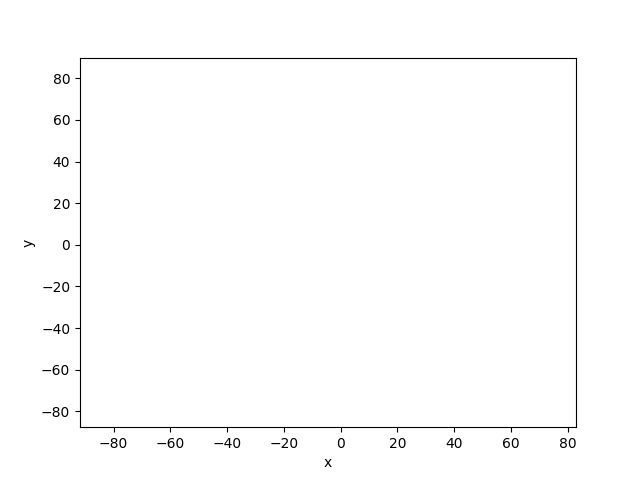

In [51]:
quad.vis.show_gif()

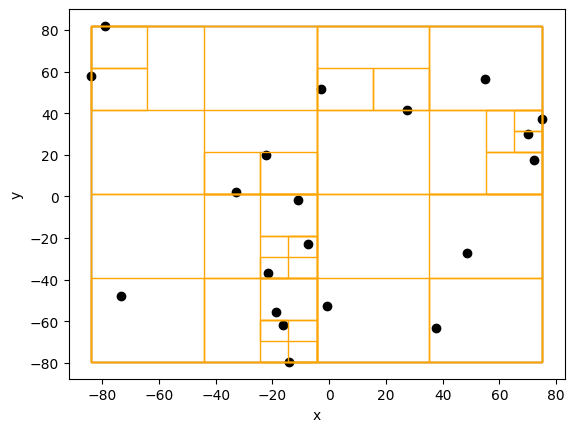

In [52]:
quad.vis.show()

In [53]:
quad.search_rectangle(rect)
# quad.vis.save("quadtree_search")
# quad.vis.save_gif("quadtree_search")

[(np.float64(75.00326554713698), np.float64(37.015511807796685)),
 (np.float64(54.77822560110667), np.float64(56.34165064146299))]

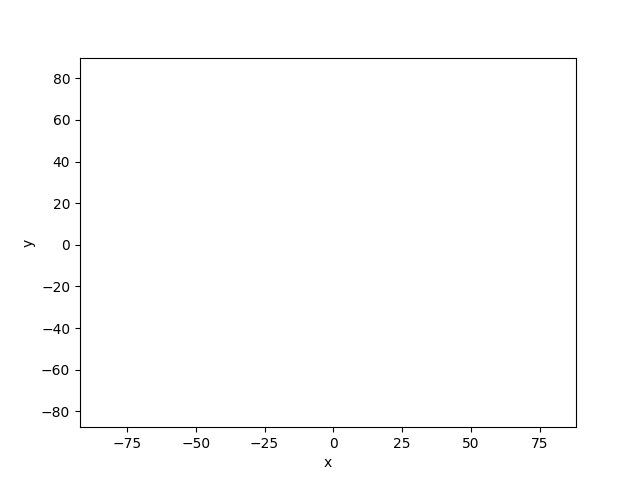

In [54]:
quad.vis.show_gif()

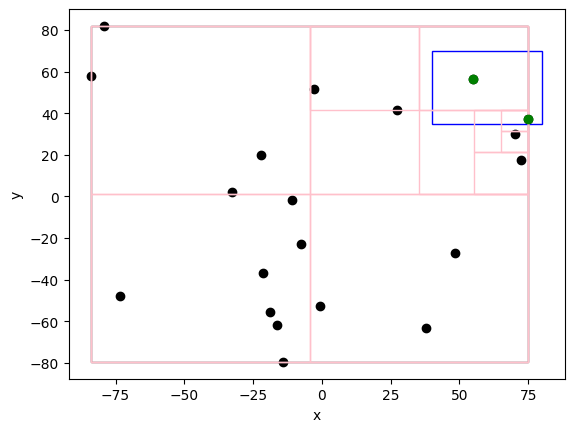

In [55]:
quad.vis.show()

Wizualizacja budowy QuadTree z domyślną wartością parametru max_capacity = 4

In [56]:
quad = QuadTreeVis(points,4)

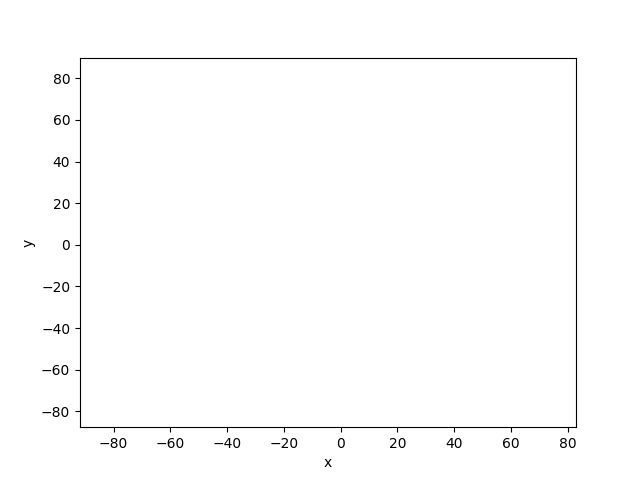

In [57]:
quad.vis.show_gif()

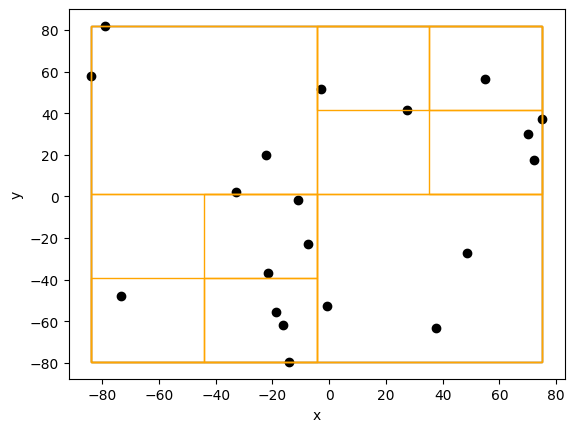

In [58]:
quad.vis.show()

Wizualizacja działania Kd-drzew

In [59]:
#KDTREE VISUALIZATION 

kd = KdTreeVis(points)
# kd.vis.save("quadtree_build")
# kd.vis.save_gif("quadtree_build")

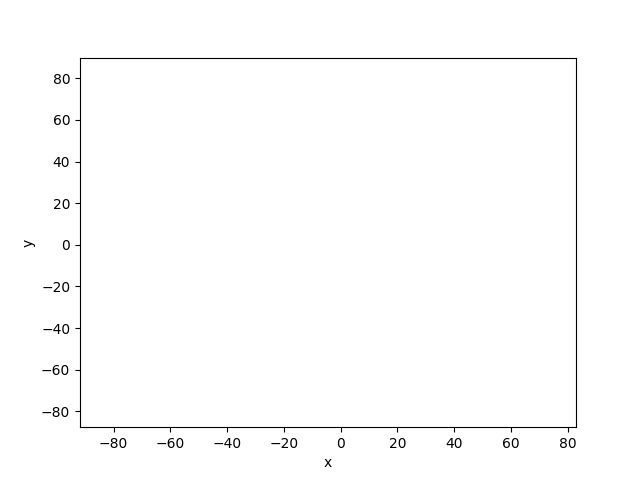

In [60]:
kd.vis.show_gif()

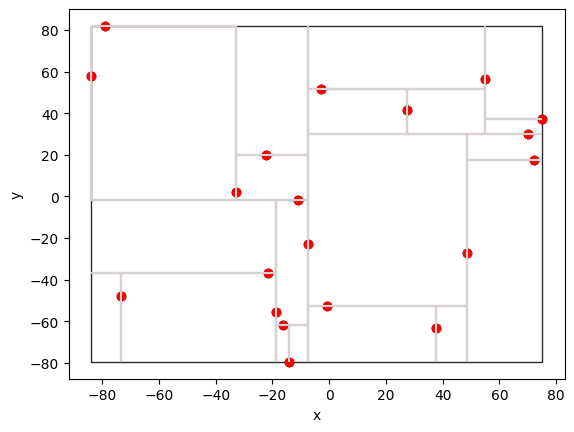

In [61]:
kd.vis.show()